# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [11]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

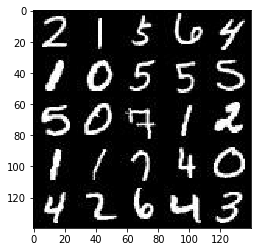

In [12]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

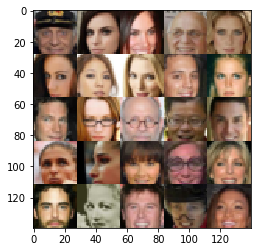

In [13]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [14]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [98]:
import problem_unittests as tests

relu_alpha = .1
def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, shape=(None, image_height, image_width, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, shape=(None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [99]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = relu_alpha
    #print(images.shape)
    channel = int(images.shape[3])
    n_dim = channel * 16
    #print('n_dim=', n_dim)
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x channel
        conv1 = tf.layers.conv2d(images, n_dim, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * conv1, conv1)
        layer1 = relu1
        #print('relu1 shape=', relu1.shape)
        # 14x14x 
        
        conv2 = tf.layers.conv2d(layer1, n_dim<<1, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(conv2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        layer2 = relu2
        #print('relu2 shape=', relu2.shape)
        # 7x7x 
        
        conv3 = tf.layers.conv2d(layer2, n_dim<<2, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(conv3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        layer3 = relu3
        #print('relu3 shape=', relu3.shape)
        # 4x4x 

        # Flatten it
        sh = layer3.shape
        n_nodes = int(sh[1] * sh[2] * sh[3])
        #print(n_nodes, type(n_nodes))
        flat = tf.reshape(layer3, (-1, n_nodes))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [100]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = relu_alpha
    #print('is_train=', is_train, ', reuse=', reuse)
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        size0 = (h0, w0, c0) = (3,3,512)
        layer0 = tf.layers.dense(z, h0*w0*c0)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(layer0, (-1, *size0))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        #print('size of x1=', x1.shape)
        # 3x3x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 3, strides=2, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        #print('size of x2=', x2.shape)
        # 7x7x256 now
        
        #x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        #print('size of x3=', x3.shape)
        # 14x14x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 28 x 28 x channel now
        #print('size of logits = ', logits.shape)
        
        # [-1.0, 1.0] -> [-0.5, 0.5]
        out = tf.tanh(logits)/2
        print(out)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tensor("truediv:0", shape=(?, 28, 28, 5), dtype=float32)
Tensor("truediv_1:0", shape=(?, 28, 28, 5), dtype=float32)
Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [101]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tensor("generator/truediv:0", shape=(?, 28, 28, 4), dtype=float32)
Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [102]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [103]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [104]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    shape = data_shape[1:]
    n_channel = shape[2]
    print('data_shape = ', data_shape)
    print('data image mode=', data_image_mode)
    input_real, input_z, learning_rate_tensor = model_inputs(*shape, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, n_channel)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

    #samples, losses = [], []
    steps = 0
    every_step = 50
    #batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            steps = 0
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                # Sample random noise for G
                #print(batch_images[0])
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_z: batch_z, input_real: batch_images, learning_rate_tensor : learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, learning_rate_tensor : learning_rate})
                if steps % every_step ==0:
                    print(epoch_i, steps)
                    train_d_loss = d_loss.eval({input_z: batch_z, input_real: batch_images, learning_rate_tensor:learning_rate})
                    train_g_loss = g_loss.eval({input_z: batch_z, learning_rate_tensor:learning_rate})
                    print("loss: g_loss={:.4f}, d_loss={:.4f}".format(train_g_loss, train_d_loss))
                    show_generator_output(sess, 16, input_z, n_channel, data_image_mode)
                
#         batch_z = np.random.uniform(-.5, .5, size=(batch_size, z_dim))
#         batch_images_list = get_batches(batch_size)
#         print('[end]: batch_z = ', batch_z, ', batch_images = ', batch_images)
#         train_d_loss = d_loss.eval({input_z: batch_z, input_real: batch_images, learning_rate_tensor:learning_rate})
#         print('here we go, continue ...')
#         train_g_loss = g_loss.eval({input_z: batch_z, learning_rate_tensor:learning_rate})
#         print('last printing ...')
#         print("[end] loss: g_loss={:.4f}, d_loss={:.4f}".format(train_g_loss, train_d_loss))
        show_generator_output(sess, 64, input_z, n_channel, data_image_mode)
    print('the end!')
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

data_shape =  (60000, 28, 28, 1)
data image mode= L
Tensor("generator/truediv:0", shape=(?, 28, 28, 1), dtype=float32)
0 50
loss: g_loss=1.9122, d_loss=0.7923
Tensor("generator_1/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


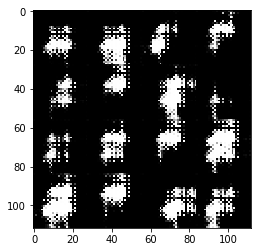

0 100
loss: g_loss=1.3325, d_loss=0.6636
Tensor("generator_2/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


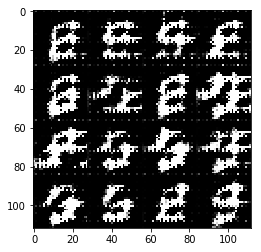

0 150
loss: g_loss=2.3780, d_loss=0.2595
Tensor("generator_3/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


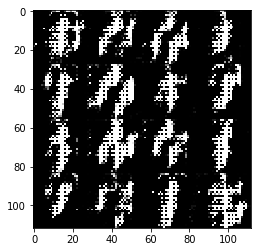

0 200
loss: g_loss=4.5529, d_loss=0.0186
Tensor("generator_4/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


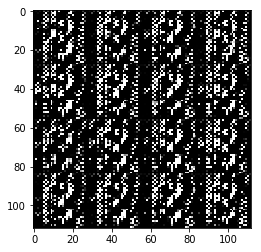

0 250
loss: g_loss=4.0193, d_loss=0.0849
Tensor("generator_5/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


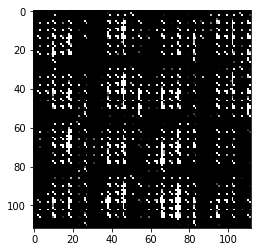

0 300
loss: g_loss=5.1377, d_loss=0.3432
Tensor("generator_6/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


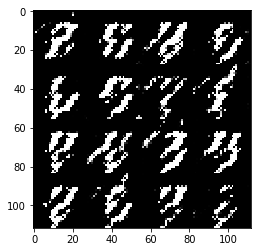

0 350
loss: g_loss=2.3662, d_loss=0.2348
Tensor("generator_7/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


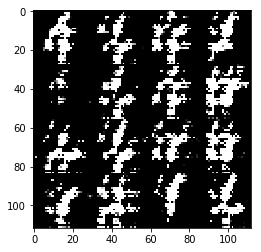

0 400
loss: g_loss=2.6139, d_loss=0.1742
Tensor("generator_8/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


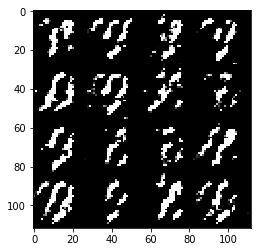

0 450
loss: g_loss=0.4881, d_loss=1.7544
Tensor("generator_9/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


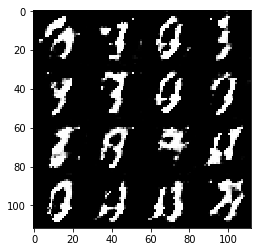

0 500
loss: g_loss=0.7829, d_loss=1.0622
Tensor("generator_10/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


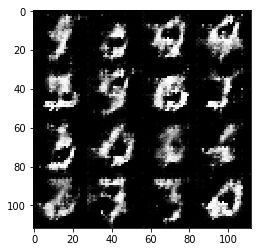

0 550
loss: g_loss=1.5095, d_loss=0.9791
Tensor("generator_11/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


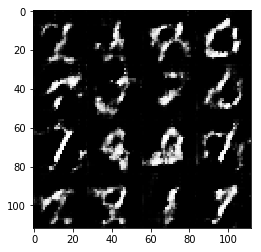

0 600
loss: g_loss=0.5034, d_loss=1.2454
Tensor("generator_12/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


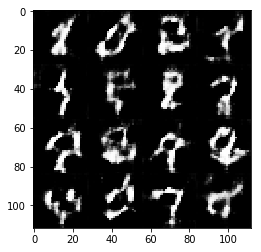

0 650
loss: g_loss=0.9380, d_loss=0.9924
Tensor("generator_13/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


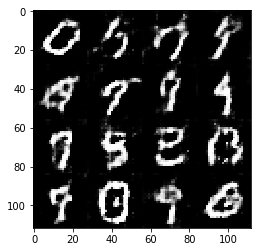

0 700
loss: g_loss=0.8664, d_loss=1.0183
Tensor("generator_14/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


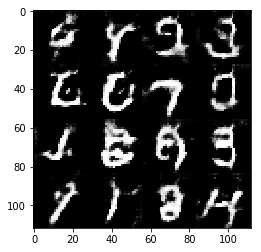

0 750
loss: g_loss=0.6108, d_loss=1.1422
Tensor("generator_15/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


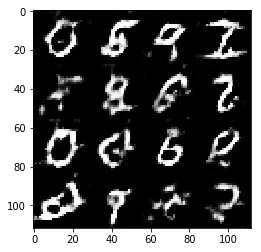

0 800
loss: g_loss=0.7809, d_loss=1.0602
Tensor("generator_16/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


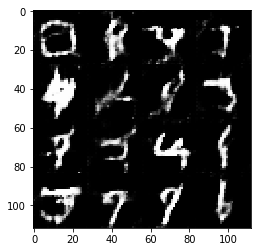

0 850
loss: g_loss=0.4913, d_loss=1.3296
Tensor("generator_17/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


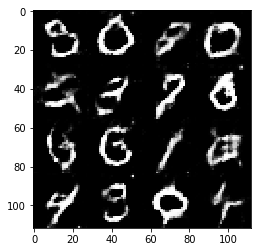

0 900
loss: g_loss=0.6947, d_loss=0.9946
Tensor("generator_18/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


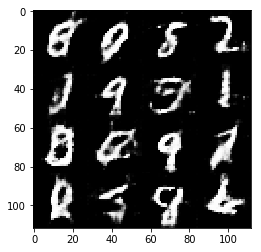

0 950
loss: g_loss=0.4231, d_loss=1.5402
Tensor("generator_19/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


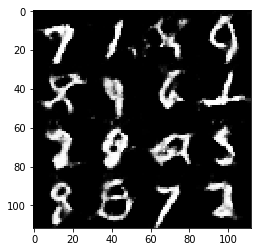

0 1000
loss: g_loss=0.5458, d_loss=1.2786
Tensor("generator_20/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


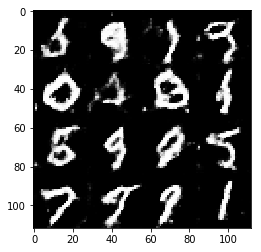

0 1050
loss: g_loss=0.5989, d_loss=1.3600
Tensor("generator_21/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


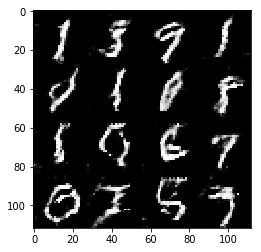

0 1100
loss: g_loss=0.2594, d_loss=1.8270
Tensor("generator_22/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


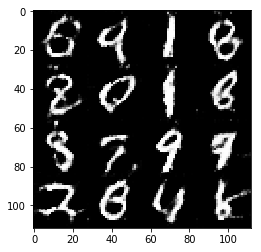

0 1150
loss: g_loss=0.9198, d_loss=0.9516
Tensor("generator_23/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


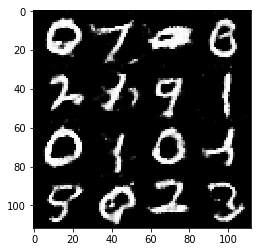

0 1200
loss: g_loss=1.3642, d_loss=0.8737
Tensor("generator_24/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


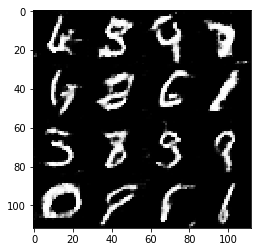

0 1250
loss: g_loss=0.8151, d_loss=1.0177
Tensor("generator_25/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


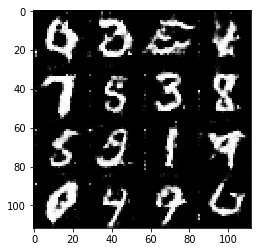

0 1300
loss: g_loss=0.7490, d_loss=1.2670
Tensor("generator_26/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


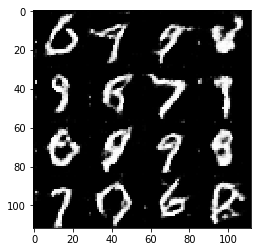

0 1350
loss: g_loss=0.9080, d_loss=1.1011
Tensor("generator_27/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


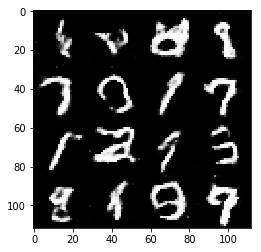

0 1400
loss: g_loss=0.5560, d_loss=1.3477
Tensor("generator_28/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


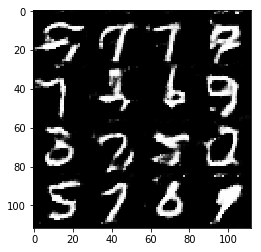

0 1450
loss: g_loss=3.0919, d_loss=1.4169
Tensor("generator_29/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


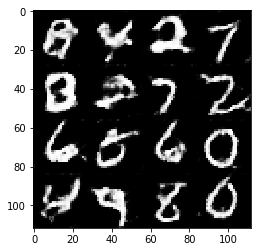

0 1500
loss: g_loss=0.3992, d_loss=1.4842
Tensor("generator_30/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


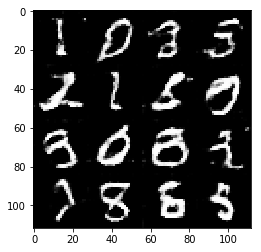

0 1550
loss: g_loss=1.5727, d_loss=1.2952
Tensor("generator_31/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


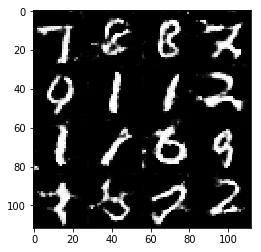

0 1600
loss: g_loss=1.3323, d_loss=0.6570
Tensor("generator_32/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


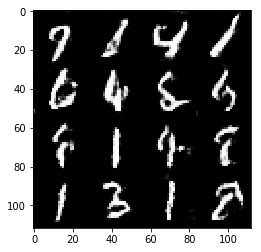

0 1650
loss: g_loss=0.9865, d_loss=0.9451
Tensor("generator_33/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


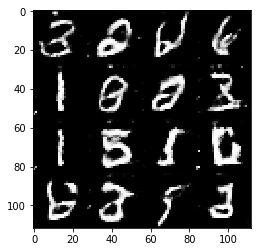

0 1700
loss: g_loss=0.9725, d_loss=0.8489
Tensor("generator_34/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


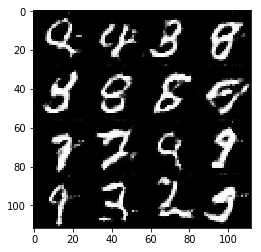

0 1750
loss: g_loss=2.0228, d_loss=0.6668
Tensor("generator_35/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


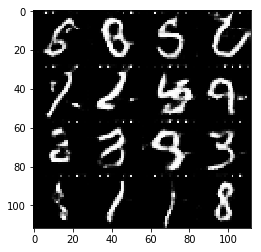

0 1800
loss: g_loss=0.3476, d_loss=1.7019
Tensor("generator_36/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


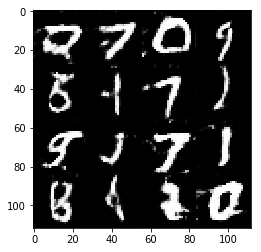

0 1850
loss: g_loss=0.4136, d_loss=1.6217
Tensor("generator_37/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


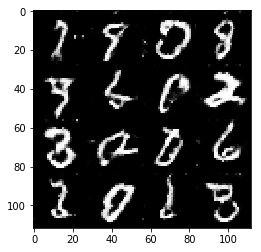

1 50
loss: g_loss=1.0208, d_loss=1.0038
Tensor("generator_38/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


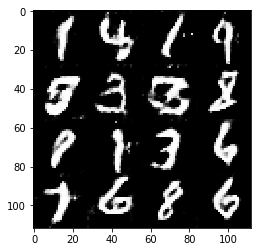

1 100
loss: g_loss=0.8819, d_loss=0.8901
Tensor("generator_39/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


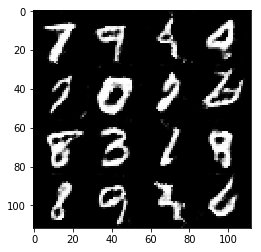

1 150
loss: g_loss=0.6104, d_loss=1.3368
Tensor("generator_40/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


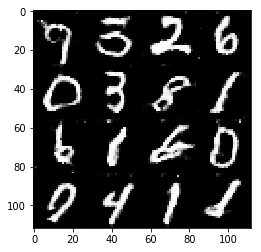

1 200
loss: g_loss=0.8432, d_loss=1.0365
Tensor("generator_41/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


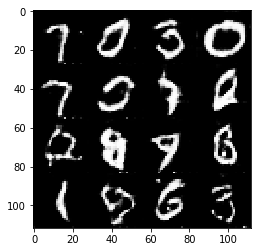

1 250
loss: g_loss=1.0460, d_loss=1.0987
Tensor("generator_42/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


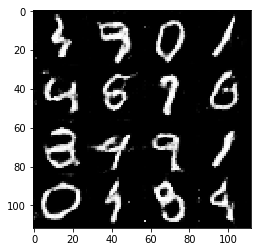

1 300
loss: g_loss=0.9492, d_loss=0.8288
Tensor("generator_43/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


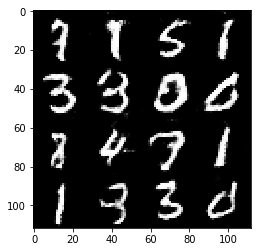

1 350
loss: g_loss=0.6688, d_loss=1.2298
Tensor("generator_44/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


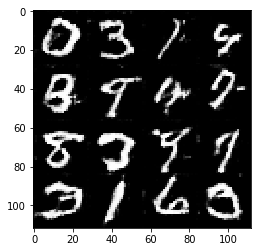

1 400
loss: g_loss=0.4452, d_loss=1.5149
Tensor("generator_45/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


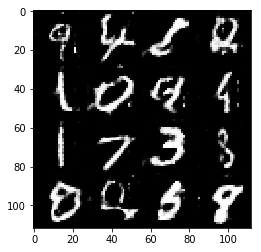

1 450
loss: g_loss=0.8725, d_loss=0.8250
Tensor("generator_46/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


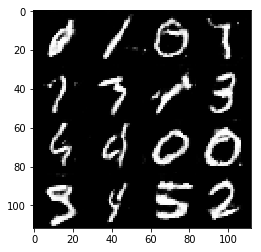

1 500
loss: g_loss=0.5799, d_loss=1.3558
Tensor("generator_47/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


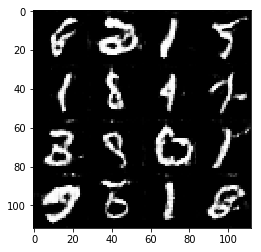

1 550
loss: g_loss=1.0216, d_loss=0.9037
Tensor("generator_48/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


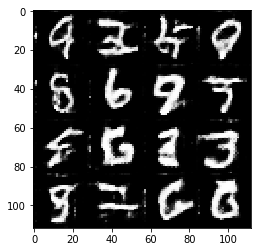

1 600
loss: g_loss=0.1580, d_loss=2.8130
Tensor("generator_49/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


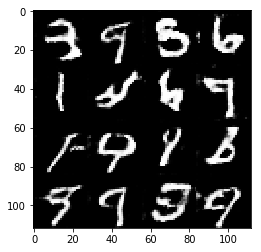

1 650
loss: g_loss=0.9364, d_loss=0.9590
Tensor("generator_50/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


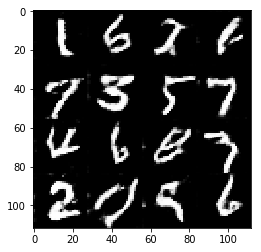

1 700
loss: g_loss=0.1042, d_loss=2.8955
Tensor("generator_51/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


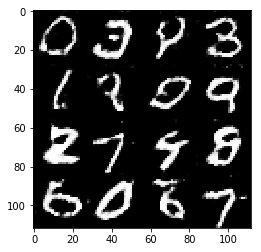

1 750
loss: g_loss=1.0535, d_loss=0.8937
Tensor("generator_52/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


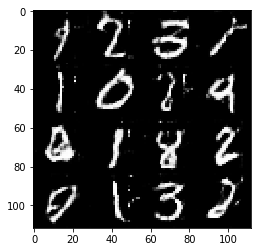

1 800
loss: g_loss=0.6304, d_loss=1.1739
Tensor("generator_53/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


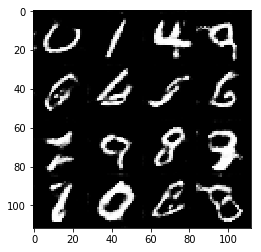

1 850
loss: g_loss=0.5033, d_loss=1.3720
Tensor("generator_54/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


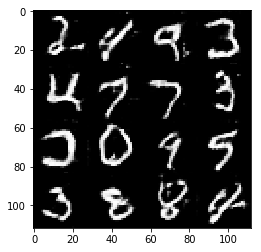

1 900
loss: g_loss=2.6333, d_loss=0.9777
Tensor("generator_55/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


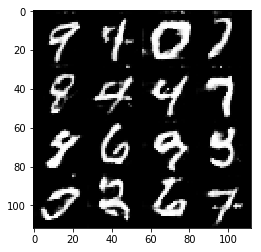

1 950
loss: g_loss=2.2024, d_loss=0.4976
Tensor("generator_56/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


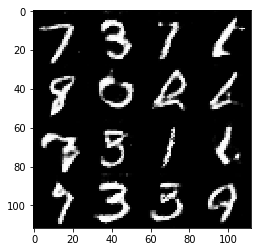

1 1000
loss: g_loss=1.2412, d_loss=0.7373
Tensor("generator_57/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


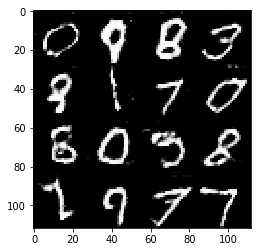

1 1050
loss: g_loss=0.2887, d_loss=2.1069
Tensor("generator_58/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


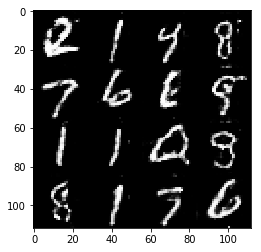

1 1100
loss: g_loss=1.3603, d_loss=0.9687
Tensor("generator_59/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


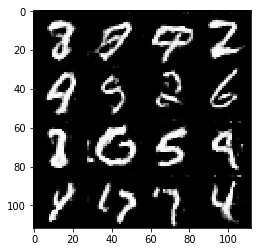

1 1150
loss: g_loss=1.0896, d_loss=0.7466
Tensor("generator_60/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


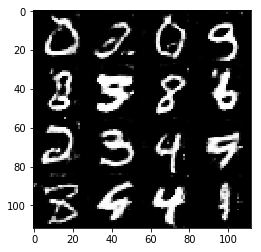

1 1200
loss: g_loss=1.9223, d_loss=0.9893
Tensor("generator_61/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


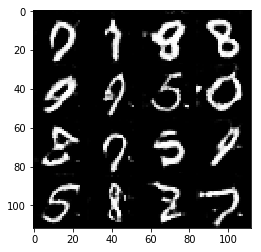

1 1250
loss: g_loss=1.3144, d_loss=0.5424
Tensor("generator_62/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


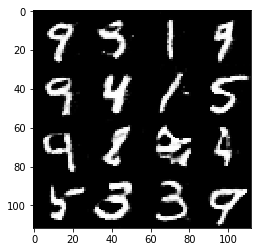

1 1300
loss: g_loss=0.8407, d_loss=0.9118
Tensor("generator_63/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


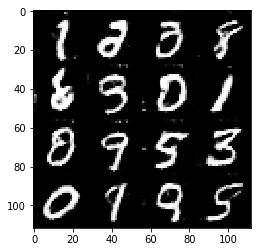

1 1350
loss: g_loss=0.5487, d_loss=1.1721
Tensor("generator_64/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


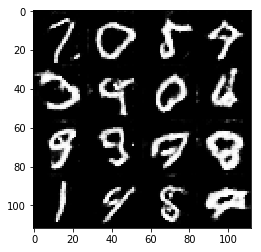

1 1400
loss: g_loss=0.0749, d_loss=3.8928
Tensor("generator_65/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


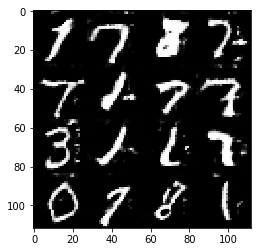

1 1450
loss: g_loss=0.8187, d_loss=1.1447
Tensor("generator_66/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


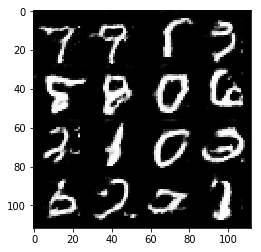

1 1500
loss: g_loss=0.5681, d_loss=1.2730
Tensor("generator_67/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


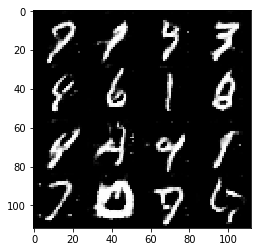

1 1550
loss: g_loss=1.5754, d_loss=0.5157
Tensor("generator_68/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


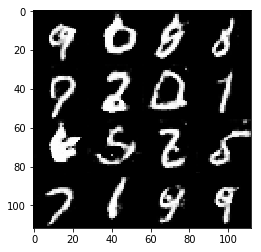

1 1600
loss: g_loss=0.2026, d_loss=2.3348
Tensor("generator_69/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


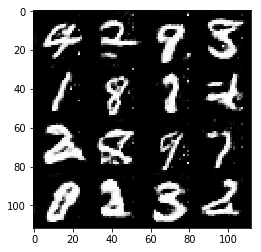

1 1650
loss: g_loss=0.8371, d_loss=0.9457
Tensor("generator_70/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


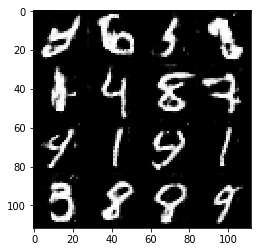

1 1700
loss: g_loss=1.5950, d_loss=0.6723
Tensor("generator_71/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


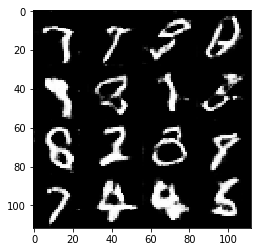

1 1750
loss: g_loss=0.6086, d_loss=1.1475
Tensor("generator_72/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


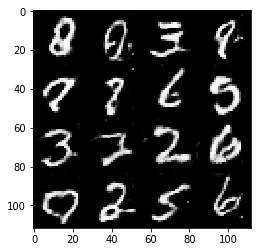

1 1800
loss: g_loss=0.2598, d_loss=2.1450
Tensor("generator_73/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


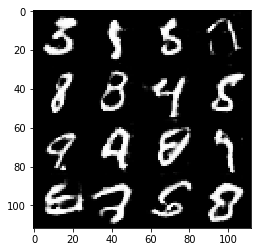

1 1850
loss: g_loss=0.6159, d_loss=1.1612
Tensor("generator_74/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


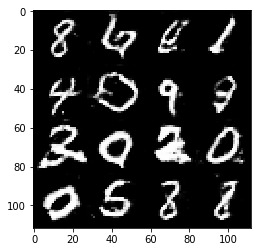

Tensor("generator_75/truediv:0", shape=(?, 28, 28, 1), dtype=float32)


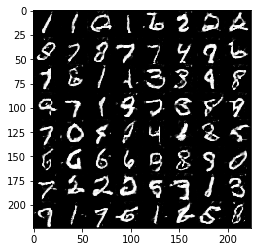

the end!


In [117]:
batch_size = 32
z_dim = 120
# lr=.01 65%
learning_rate = .008
beta1 = .5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

data_shape =  (202599, 28, 28, 3)
data image mode= RGB
Tensor("generator/truediv:0", shape=(?, 28, 28, 3), dtype=float32)
0 50
loss: g_loss=2.4734, d_loss=1.0216
Tensor("generator_1/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


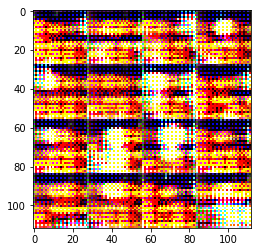

0 100
loss: g_loss=0.6195, d_loss=1.0601
Tensor("generator_2/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


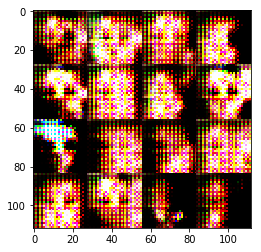

0 150
loss: g_loss=3.3421, d_loss=0.0987
Tensor("generator_3/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


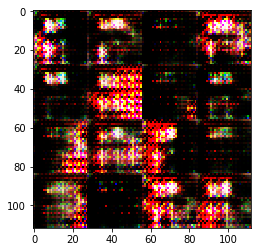

0 200
loss: g_loss=4.3615, d_loss=0.0318
Tensor("generator_4/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


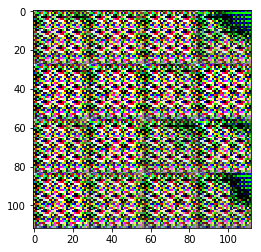

0 250
loss: g_loss=1.1902, d_loss=0.7855
Tensor("generator_5/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


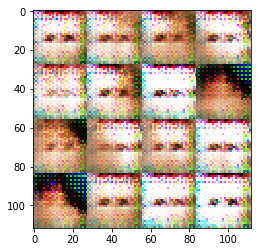

0 300
loss: g_loss=2.8434, d_loss=0.8654
Tensor("generator_6/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


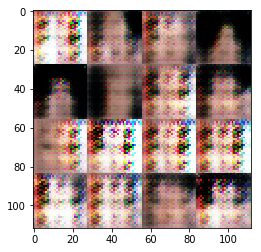

0 350
loss: g_loss=0.6202, d_loss=1.7072
Tensor("generator_7/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


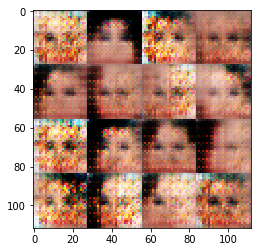

0 400
loss: g_loss=0.7526, d_loss=1.4851
Tensor("generator_8/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


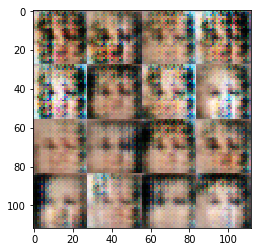

0 450
loss: g_loss=0.8229, d_loss=0.8444
Tensor("generator_9/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


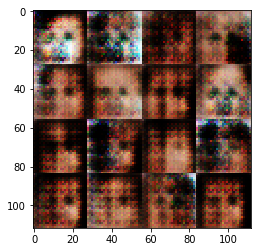

0 500
loss: g_loss=0.9019, d_loss=0.8232
Tensor("generator_10/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


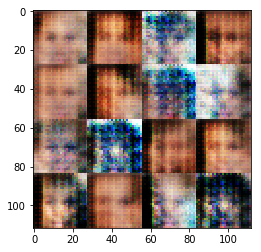

0 550
loss: g_loss=0.9752, d_loss=1.0244
Tensor("generator_11/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


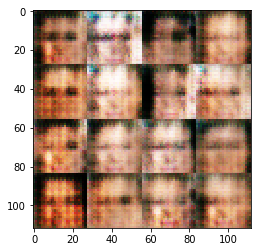

0 600
loss: g_loss=0.5143, d_loss=1.2264
Tensor("generator_12/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


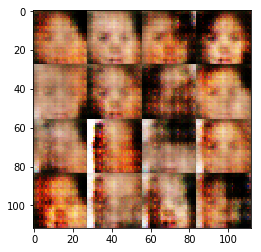

0 650
loss: g_loss=1.0728, d_loss=1.0899
Tensor("generator_13/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


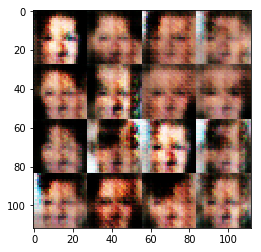

0 700
loss: g_loss=1.4041, d_loss=1.4153
Tensor("generator_14/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


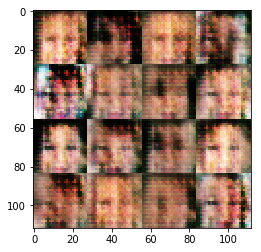

0 750
loss: g_loss=0.9464, d_loss=0.8076
Tensor("generator_15/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


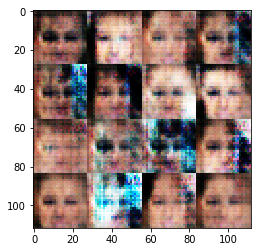

0 800
loss: g_loss=1.4726, d_loss=0.7292
Tensor("generator_16/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


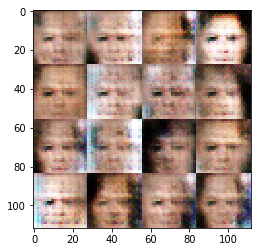

0 850
loss: g_loss=0.6644, d_loss=1.1014
Tensor("generator_17/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


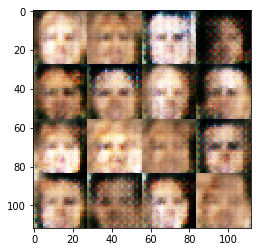

0 900
loss: g_loss=0.8625, d_loss=1.0031
Tensor("generator_18/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


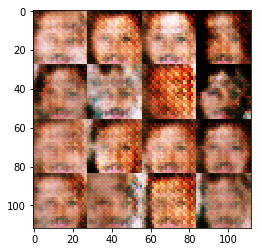

0 950
loss: g_loss=1.7123, d_loss=0.8483
Tensor("generator_19/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


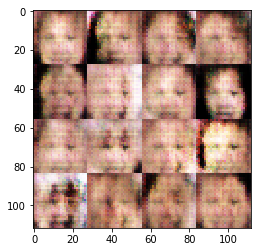

0 1000
loss: g_loss=0.5006, d_loss=1.4110
Tensor("generator_20/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


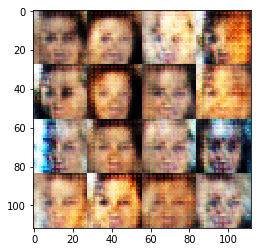

0 1050
loss: g_loss=0.8492, d_loss=1.0694
Tensor("generator_21/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


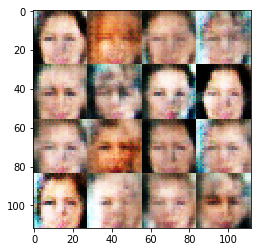

0 1100
loss: g_loss=0.8180, d_loss=1.2758
Tensor("generator_22/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


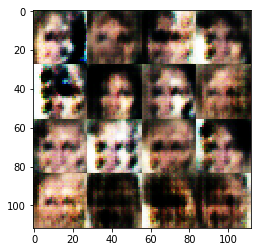

0 1150
loss: g_loss=1.8080, d_loss=1.2094
Tensor("generator_23/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


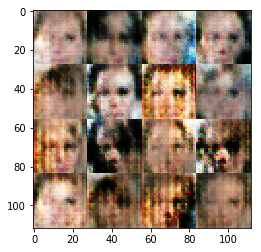

0 1200
loss: g_loss=1.0348, d_loss=0.8574
Tensor("generator_24/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


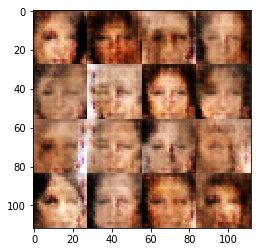

0 1250
loss: g_loss=2.1008, d_loss=1.6465
Tensor("generator_25/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


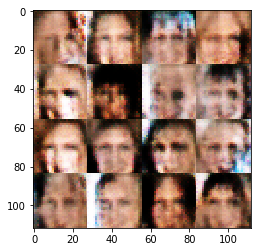

0 1300
loss: g_loss=1.3953, d_loss=0.8634
Tensor("generator_26/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


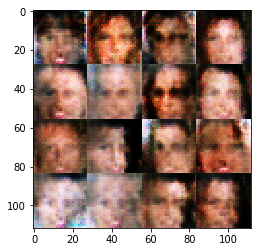

0 1350
loss: g_loss=1.6347, d_loss=1.2698
Tensor("generator_27/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


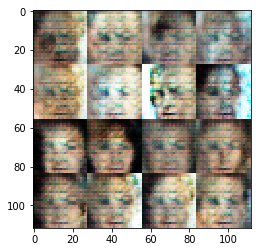

0 1400
loss: g_loss=1.0808, d_loss=0.8129
Tensor("generator_28/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


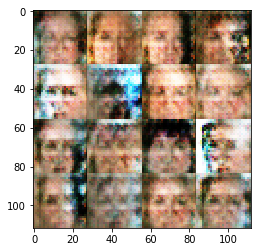

0 1450
loss: g_loss=1.0152, d_loss=0.8772
Tensor("generator_29/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


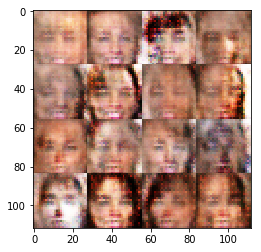

0 1500
loss: g_loss=2.0743, d_loss=0.5443
Tensor("generator_30/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


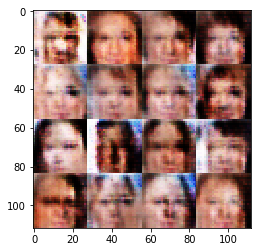

0 1550
loss: g_loss=1.0989, d_loss=0.6793
Tensor("generator_31/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


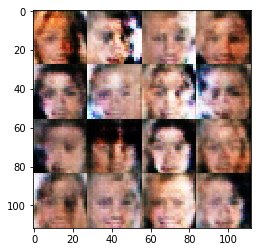

0 1600
loss: g_loss=0.6602, d_loss=1.1261
Tensor("generator_32/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


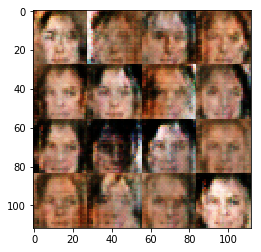

0 1650
loss: g_loss=1.5891, d_loss=0.8415
Tensor("generator_33/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


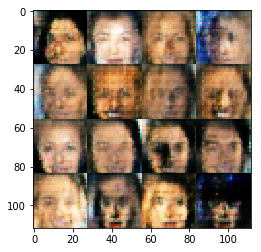

0 1700
loss: g_loss=1.1885, d_loss=0.5634
Tensor("generator_34/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


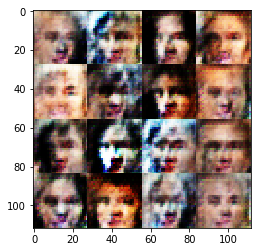

0 1750
loss: g_loss=3.1238, d_loss=0.1517
Tensor("generator_35/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


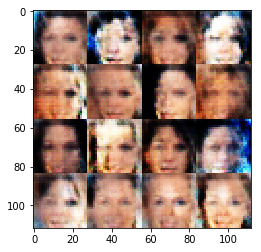

0 1800
loss: g_loss=1.2840, d_loss=0.9857
Tensor("generator_36/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


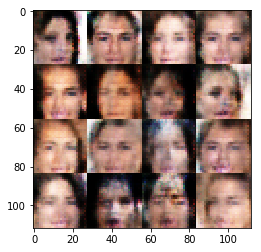

0 1850
loss: g_loss=0.3669, d_loss=1.6681
Tensor("generator_37/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


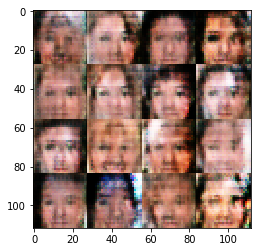

0 1900
loss: g_loss=2.4883, d_loss=0.1095
Tensor("generator_38/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


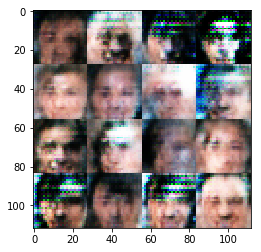

0 1950
loss: g_loss=0.5125, d_loss=1.2423
Tensor("generator_39/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


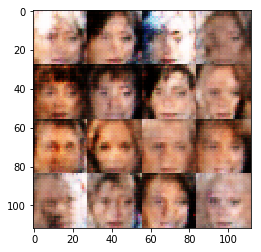

0 2000
loss: g_loss=0.3270, d_loss=1.6922
Tensor("generator_40/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


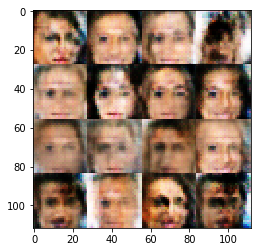

0 2050
loss: g_loss=0.8851, d_loss=1.1040
Tensor("generator_41/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


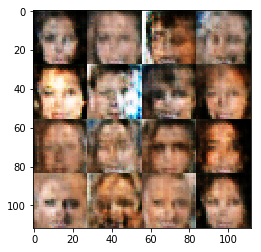

0 2100
loss: g_loss=0.8201, d_loss=0.8564
Tensor("generator_42/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


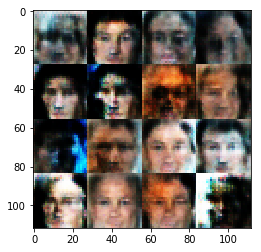

0 2150
loss: g_loss=1.1310, d_loss=0.5280
Tensor("generator_43/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


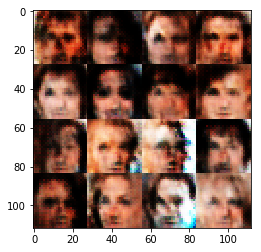

0 2200
loss: g_loss=3.9758, d_loss=0.0267
Tensor("generator_44/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


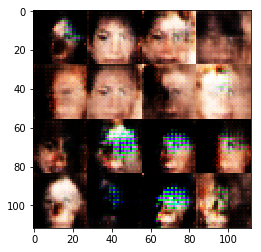

0 2250
loss: g_loss=4.7024, d_loss=0.0117
Tensor("generator_45/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


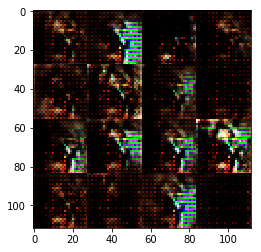

0 2300
loss: g_loss=5.5247, d_loss=0.0070
Tensor("generator_46/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


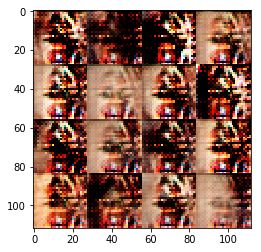

0 2350
loss: g_loss=0.5313, d_loss=1.3816
Tensor("generator_47/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


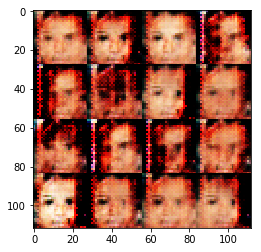

0 2400
loss: g_loss=0.9689, d_loss=0.8024
Tensor("generator_48/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


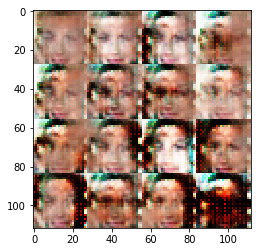

0 2450
loss: g_loss=4.4131, d_loss=0.0506
Tensor("generator_49/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


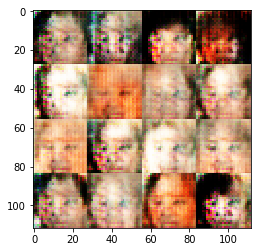

0 2500
loss: g_loss=0.4438, d_loss=1.5683
Tensor("generator_50/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


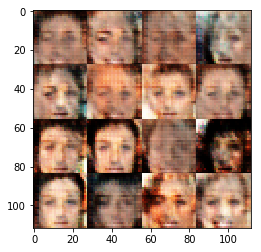

0 2550
loss: g_loss=1.1878, d_loss=0.8391
Tensor("generator_51/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


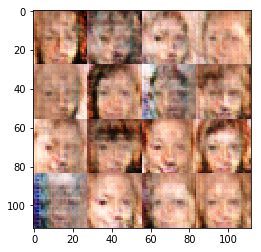

0 2600
loss: g_loss=1.2092, d_loss=0.9011
Tensor("generator_52/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


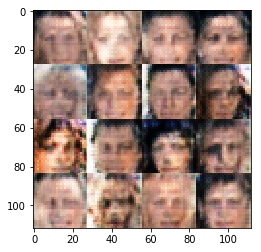

0 2650
loss: g_loss=1.1306, d_loss=0.8958
Tensor("generator_53/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


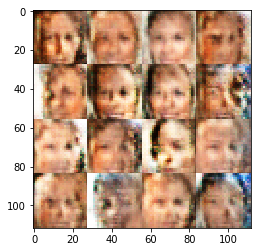

0 2700
loss: g_loss=0.9853, d_loss=0.8357
Tensor("generator_54/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


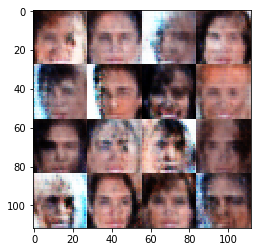

0 2750
loss: g_loss=1.1546, d_loss=0.5679
Tensor("generator_55/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


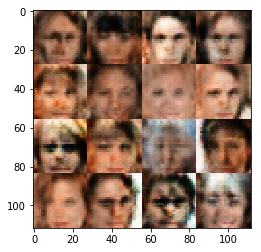

0 2800
loss: g_loss=1.9609, d_loss=1.2128
Tensor("generator_56/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


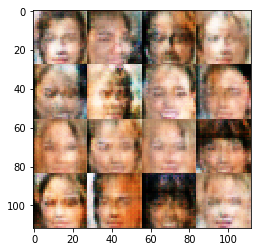

0 2850
loss: g_loss=0.3119, d_loss=1.9673
Tensor("generator_57/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


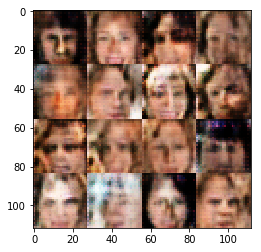

0 2900
loss: g_loss=2.3347, d_loss=1.2145
Tensor("generator_58/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


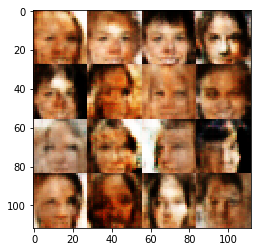

0 2950
loss: g_loss=0.8236, d_loss=0.8367
Tensor("generator_59/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


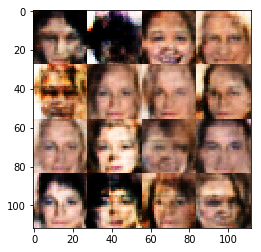

0 3000
loss: g_loss=0.8256, d_loss=1.1535
Tensor("generator_60/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


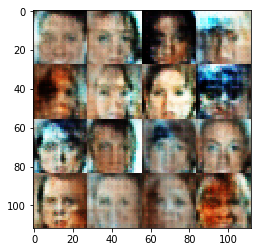

0 3050
loss: g_loss=1.7188, d_loss=1.4319
Tensor("generator_61/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


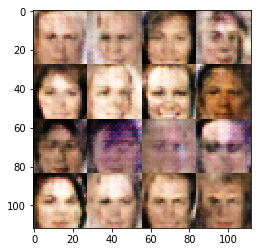

0 3100
loss: g_loss=1.1599, d_loss=0.6160
Tensor("generator_62/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


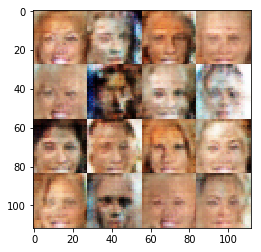

0 3150
loss: g_loss=3.0467, d_loss=2.6794
Tensor("generator_63/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


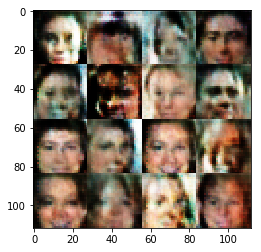

0 3200
loss: g_loss=0.7351, d_loss=0.8549
Tensor("generator_64/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


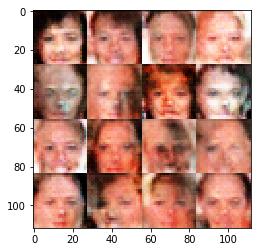

0 3250
loss: g_loss=0.9180, d_loss=0.9505
Tensor("generator_65/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


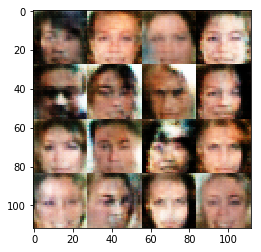

0 3300
loss: g_loss=0.6749, d_loss=1.0817
Tensor("generator_66/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


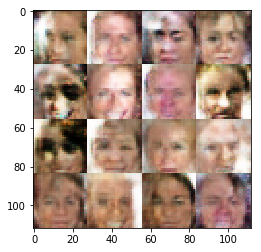

0 3350
loss: g_loss=2.9011, d_loss=0.7393
Tensor("generator_67/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


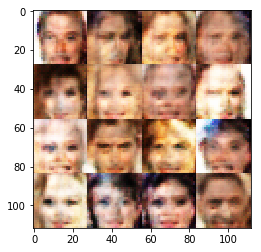

0 3400
loss: g_loss=2.8782, d_loss=0.2932
Tensor("generator_68/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


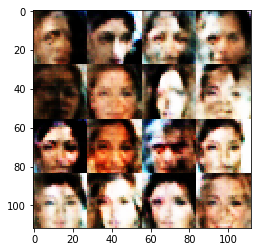

0 3450
loss: g_loss=5.5010, d_loss=0.0189
Tensor("generator_69/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


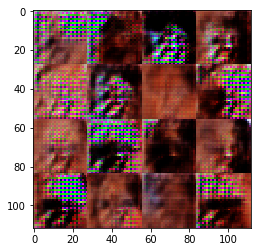

0 3500
loss: g_loss=5.4667, d_loss=0.0060
Tensor("generator_70/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


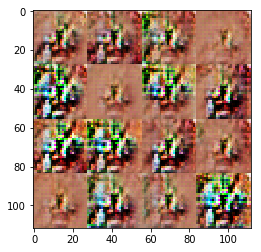

0 3550
loss: g_loss=10.4841, d_loss=0.0007
Tensor("generator_71/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


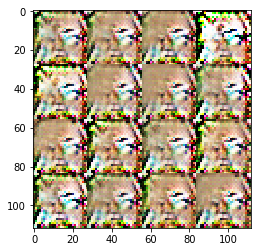

0 3600
loss: g_loss=8.0873, d_loss=0.0015
Tensor("generator_72/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


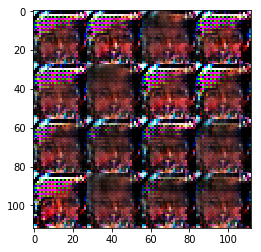

0 3650
loss: g_loss=6.9658, d_loss=0.0016
Tensor("generator_73/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


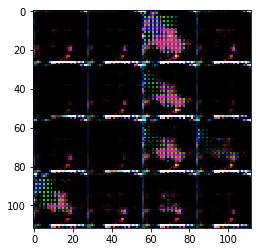

0 3700
loss: g_loss=7.0768, d_loss=0.0011
Tensor("generator_74/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


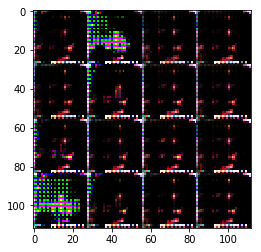

0 3750
loss: g_loss=4.2739, d_loss=0.1540
Tensor("generator_75/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


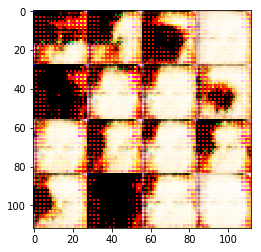

0 3800
loss: g_loss=5.4135, d_loss=0.0085
Tensor("generator_76/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


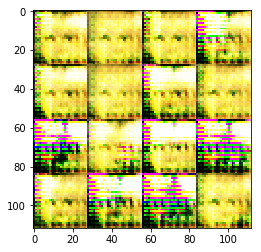

0 3850
loss: g_loss=7.1307, d_loss=2.0524
Tensor("generator_77/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


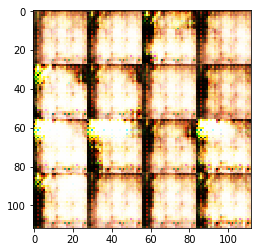

0 3900
loss: g_loss=0.3717, d_loss=1.5920
Tensor("generator_78/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


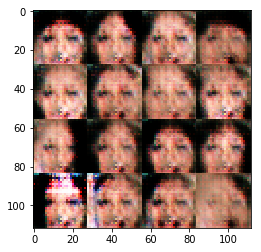

0 3950
loss: g_loss=3.0760, d_loss=0.4454
Tensor("generator_79/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


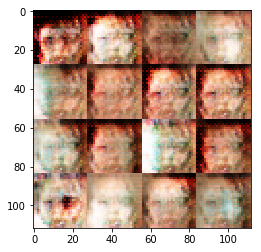

0 4000
loss: g_loss=3.4782, d_loss=1.2503
Tensor("generator_80/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


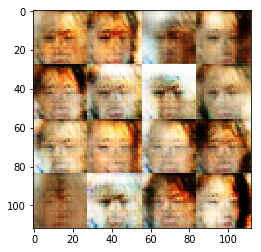

0 4050
loss: g_loss=3.4698, d_loss=2.0187
Tensor("generator_81/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


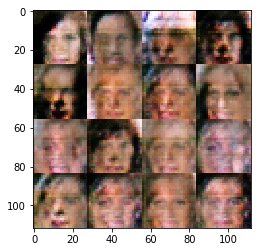

0 4100
loss: g_loss=0.6359, d_loss=1.4188
Tensor("generator_82/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


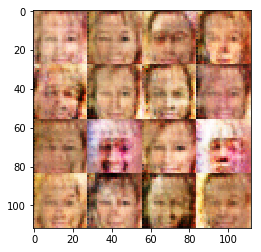

0 4150
loss: g_loss=4.4925, d_loss=0.6954
Tensor("generator_83/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


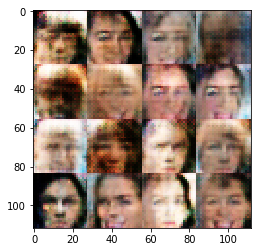

0 4200
loss: g_loss=4.1163, d_loss=0.0556
Tensor("generator_84/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


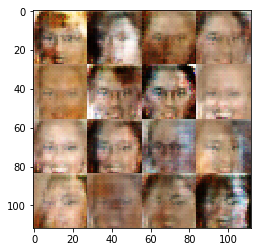

0 4250
loss: g_loss=1.0323, d_loss=1.1232
Tensor("generator_85/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


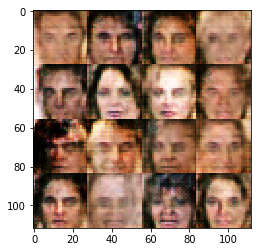

0 4300
loss: g_loss=0.7351, d_loss=1.0563
Tensor("generator_86/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


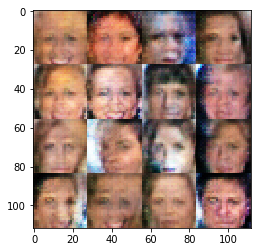

0 4350
loss: g_loss=0.7818, d_loss=1.1241
Tensor("generator_87/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


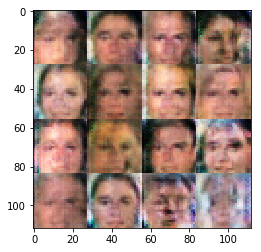

0 4400
loss: g_loss=0.3659, d_loss=1.5582
Tensor("generator_88/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


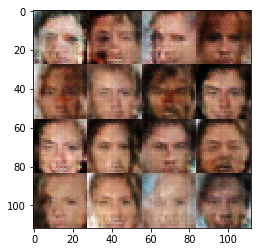

0 4450
loss: g_loss=0.9083, d_loss=1.0371
Tensor("generator_89/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


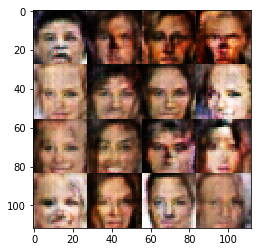

0 4500
loss: g_loss=1.2831, d_loss=0.6895
Tensor("generator_90/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


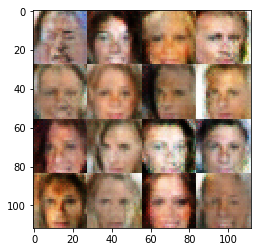

0 4550
loss: g_loss=0.8944, d_loss=0.9282
Tensor("generator_91/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


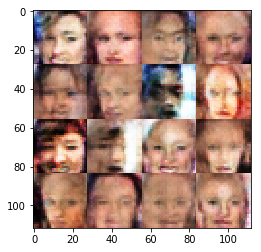

0 4600
loss: g_loss=0.5808, d_loss=1.2095
Tensor("generator_92/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


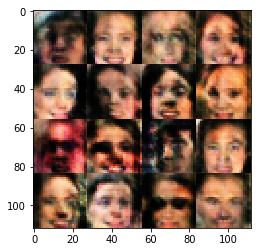

0 4650
loss: g_loss=0.6904, d_loss=1.4609
Tensor("generator_93/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


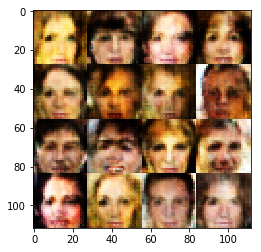

0 4700
loss: g_loss=0.8279, d_loss=0.9940
Tensor("generator_94/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


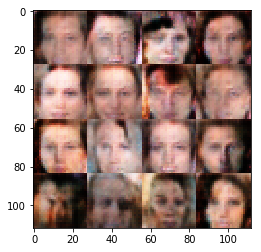

0 4750
loss: g_loss=1.1837, d_loss=0.9593
Tensor("generator_95/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


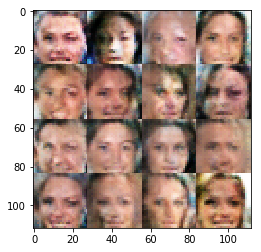

0 4800
loss: g_loss=0.1285, d_loss=2.6922
Tensor("generator_96/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


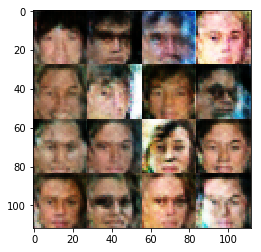

0 4850
loss: g_loss=1.4443, d_loss=1.1726
Tensor("generator_97/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


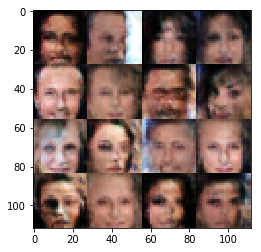

0 4900
loss: g_loss=1.5338, d_loss=1.5506
Tensor("generator_98/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


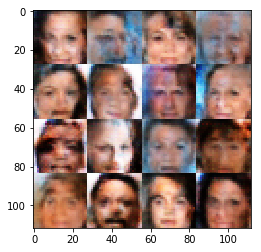

0 4950
loss: g_loss=2.1753, d_loss=0.6359
Tensor("generator_99/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


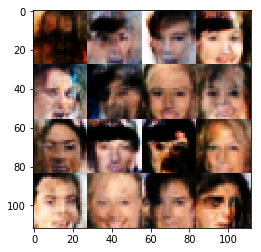

0 5000
loss: g_loss=0.9910, d_loss=0.8309
Tensor("generator_100/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


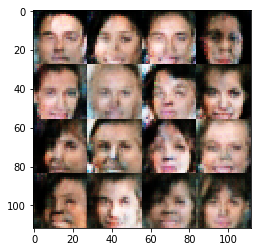

0 5050
loss: g_loss=1.0499, d_loss=0.7875
Tensor("generator_101/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


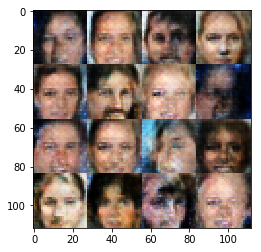

0 5100
loss: g_loss=4.2793, d_loss=0.0199
Tensor("generator_102/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


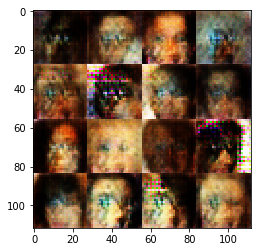

0 5150
loss: g_loss=5.3986, d_loss=0.0089
Tensor("generator_103/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


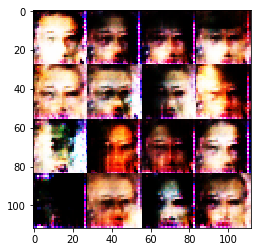

0 5200
loss: g_loss=7.9075, d_loss=0.0009
Tensor("generator_104/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


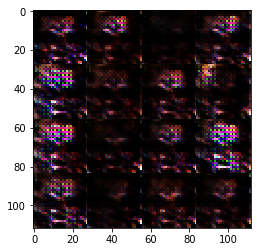

0 5250
loss: g_loss=6.6210, d_loss=0.0020
Tensor("generator_105/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


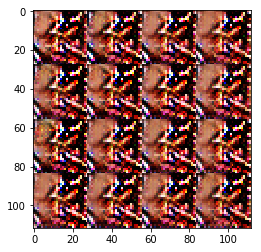

0 5300
loss: g_loss=5.8623, d_loss=0.0034
Tensor("generator_106/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


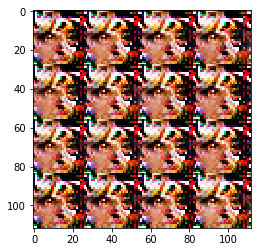

0 5350
loss: g_loss=5.7890, d_loss=0.0032
Tensor("generator_107/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


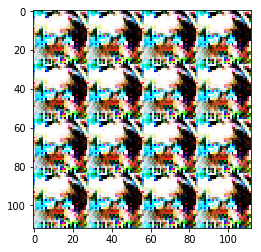

0 5400
loss: g_loss=0.4887, d_loss=0.9889
Tensor("generator_108/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


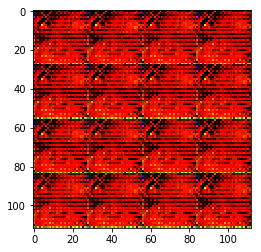

0 5450
loss: g_loss=10.7902, d_loss=0.0035
Tensor("generator_109/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


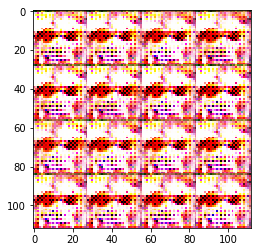

0 5500
loss: g_loss=6.1832, d_loss=0.1516
Tensor("generator_110/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


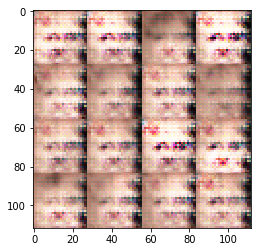

0 5550
loss: g_loss=5.3995, d_loss=0.2843
Tensor("generator_111/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


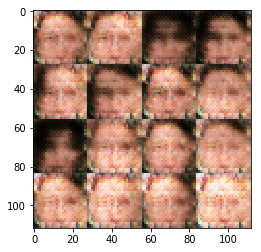

0 5600
loss: g_loss=3.2159, d_loss=0.0587
Tensor("generator_112/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


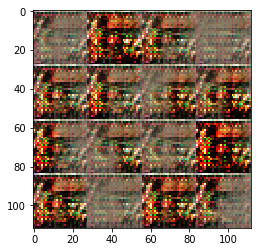

0 5650
loss: g_loss=6.4936, d_loss=0.0131
Tensor("generator_113/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


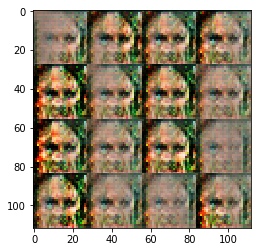

0 5700
loss: g_loss=0.9442, d_loss=0.8867
Tensor("generator_114/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


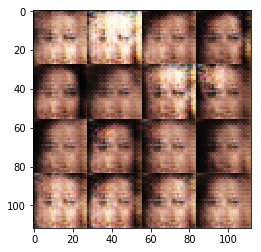

0 5750
loss: g_loss=2.2008, d_loss=0.1686
Tensor("generator_115/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


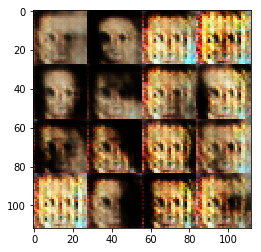

0 5800
loss: g_loss=1.3893, d_loss=0.5522
Tensor("generator_116/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


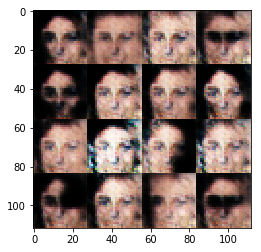

0 5850
loss: g_loss=5.9291, d_loss=0.0106
Tensor("generator_117/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


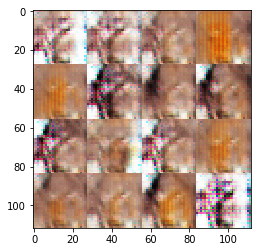

0 5900
loss: g_loss=5.4451, d_loss=0.0052
Tensor("generator_118/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


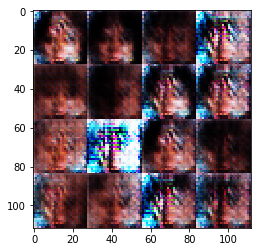

0 5950
loss: g_loss=8.3144, d_loss=0.0033
Tensor("generator_119/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


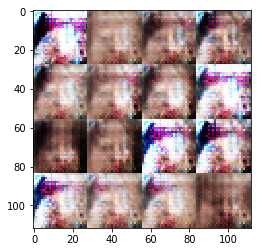

0 6000
loss: g_loss=5.5999, d_loss=0.5598
Tensor("generator_120/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


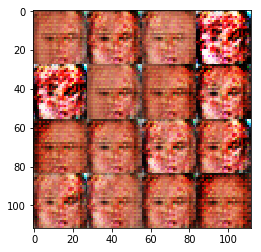

0 6050
loss: g_loss=2.9617, d_loss=0.6391
Tensor("generator_121/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


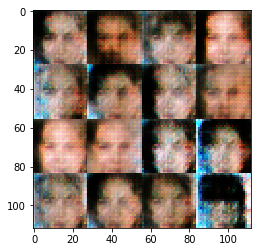

0 6100
loss: g_loss=1.5370, d_loss=0.4919
Tensor("generator_122/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


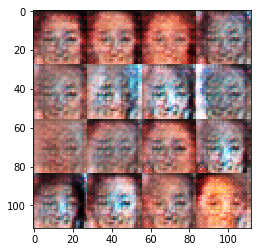

0 6150
loss: g_loss=1.8805, d_loss=0.4904
Tensor("generator_123/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


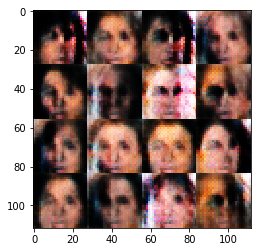

0 6200
loss: g_loss=0.2799, d_loss=2.0521
Tensor("generator_124/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


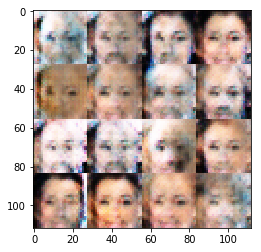

0 6250
loss: g_loss=0.5195, d_loss=1.5326
Tensor("generator_125/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


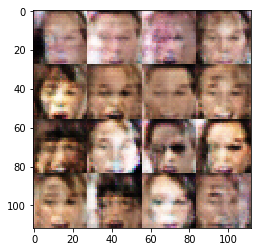

0 6300
loss: g_loss=1.0996, d_loss=0.8693
Tensor("generator_126/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


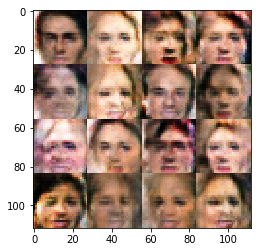

Tensor("generator_127/truediv:0", shape=(?, 28, 28, 3), dtype=float32)


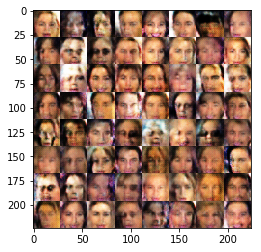

the end!


In [119]:
batch_size = 32
z_dim = 120
learning_rate = .008
beta1 = .5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.